# SIFT Feature Detection and Matching Tutorial
This notebook demonstrates a professional, modular implementation of the SIFT (Scale-Invariant Feature Transform) algorithm for image feature detection and matching.
It includes:
- A clean, step-by-step SIFT pipeline: Gaussian pyramid, Difference-of-Gaussians, keypoint detection, descriptor computation
- Comparison with OpenCV's SIFT implementation
- Visualization tools and RANSAC-based geometric filtering
- Test and evaluation cells using synthetic and real images
This notebook is designed for clarity, modularity, and ease of experimentation.

In [ ]:
# Standard imports
import math
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import ConnectionPatch
from typing import List, Tuple, Optional

# Display settings for matplotlib in notebooks
%matplotlib inline

## Helper Utilities
These functions assist with image loading, display, and reporting throughout the notebook.

In [ ]:
def load_image_gray(path: str) -> np.ndarray:
    """Load an image from disk and return a float32 grayscale image in range [0, 255].
    Raises ValueError if the image cannot be loaded."""
    img = cv2.imread(path, cv2.IMREAD_COLOR)
    if img is None:
        raise ValueError(f'Could not load image: {path}')
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(np.float32)
    return gray

def show_image(img: np.ndarray, title: Optional[str] = None, cmap: str = 'gray') -> None:
    if img.dtype != np.uint8 and img.max() <= 1.0:
        disp = (img * 255).astype(np.uint8)
    else:
        disp = img.astype(np.uint8)
    plt.figure(figsize=(6,6))
    plt.imshow(disp, cmap=cmap)
    if title:
        plt.title(title)
    plt.axis('off')
    plt.show()

## Gaussian Scale-Space (Gaussian Pyramid)
This function builds a multi-scale representation of an image using Gaussian blurring and downsampling.

In [ ]:
def build_gaussian_pyramid(image: np.ndarray, num_octaves: int = 4, num_scales: int = 6, sigma: float = 1.6) -> List[List[np.ndarray]]:
    """Build a Gaussian pyramid for multi-scale image analysis.
    Returns a list of octaves, each containing several blurred images at different scales."""
    print('Building Gaussian pyramid')
    pyramid = []
    k = 2 ** (1.0 / (num_scales - 3))

    base = image.copy()
    for o in range(num_octaves):
        octave = []
        for s in range(num_scales):
            sigma_effective = sigma * (k ** s)
            ksize = int(2 * math.ceil(3 * sigma_effective) + 1)
            blurred = cv2.GaussianBlur(base, (ksize, ksize), sigma_effective)
            octave.append(blurred)
        pyramid.append(octave)
        # Downsample base for next octave (half size)
        h, w = base.shape[:2]
        base = cv2.resize(base, (w // 2, h // 2), interpolation=cv2.INTER_LINEAR)
    return pyramid

## Difference-of-Gaussians (DoG)
This function computes Difference-of-Gaussians images from the Gaussian pyramid for keypoint detection.

In [ ]:
def compute_dog_pyramid(gaussian_pyramid: List[List[np.ndarray]]) -> List[List[np.ndarray]]:
    """Compute the Difference-of-Gaussians pyramid for feature detection."""
    print('Computing DoG pyramid')
    dog = []
    for octave in gaussian_pyramid:
        dog_octave = []
        for i in range(len(octave) - 1):
            dog_octave.append(cv2.subtract(octave[i + 1], octave[i]))
        dog.append(dog_octave)
    return dog

## Keypoint Detection (Local Extrema)
Detects local extrema in the DoG pyramid and applies contrast and edge filtering to select robust keypoints.

In [ ]:
def detect_keypoints_from_dog(dog_pyramid: List[List[np.ndarray]], contrast_threshold: float = 0.015, edge_threshold: float = 12) -> List[cv2.KeyPoint]:
    """Detects keypoints by finding local extrema in the DoG pyramid and filtering by contrast and edge response.
    Returns a list of cv2.KeyPoint objects scaled to the original image coordinates."""
    print('Detecting keypoints from DoG')
    keypoints = []
    for o_idx, octave in enumerate(dog_pyramid):
        scale = 2 ** o_idx
        for s in range(1, len(octave) - 1):
            prev_img = octave[s - 1].astype(np.float32)
            curr_img = octave[s].astype(np.float32)
            next_img = octave[s + 1].astype(np.float32)
            h, w = curr_img.shape
            for y in range(3, h - 3):
                for x in range(3, w - 3):
                    val = curr_img[y, x]
                    neighborhood = np.concatenate([
                        prev_img[y - 1:y + 2, x - 1:x + 2].ravel(),
                        curr_img[y - 1:y + 2, x - 1:x + 2].ravel(),
                        next_img[y - 1:y + 2, x - 1:x + 2].ravel()
                    ])
                    if not (val == neighborhood.max() or val == neighborhood.min()):
                        continue
                    if abs(val) / 255.0 < contrast_threshold:
                        continue
                    # Hessian-based edge removal
                    Dxx = curr_img[y, x + 1] + curr_img[y, x - 1] - 2 * curr_img[y, x]
                    Dyy = curr_img[y + 1, x] + curr_img[y - 1, x] - 2 * curr_img[y, x]
                    Dxy = (curr_img[y + 1, x + 1] - curr_img[y + 1, x - 1] - curr_img[y - 1, x + 1] + curr_img[y - 1, x - 1]) / 4.0
                    tr = Dxx + Dyy
                    det = Dxx * Dyy - Dxy * Dxy
                    if det <= 0:
                        continue
                    R = tr * tr / det
                    r_thresh = ((edge_threshold + 1) ** 2) / edge_threshold
                    if R > r_thresh:
                        continue
                    kp = cv2.KeyPoint(x=float(x * scale), y=float(y * scale), size=float(s * scale))
                    keypoints.append(kp)
    print(f'Found {len(keypoints)} keypoints')
    return keypoints

## Descriptor Computation
Computes 128-dimensional SIFT-like descriptors for each detected keypoint using gradient histograms.

In [ ]:
def compute_sift_descriptors(image: np.ndarray, keypoints: List[cv2.KeyPoint]) -> Tuple[List[cv2.KeyPoint], np.ndarray]:
    """Computes SIFT descriptors for a list of keypoints in the image.
    Returns valid keypoints and their corresponding descriptors."""
    print('Computing SIFT descriptors')
    valid_kps = []
    descriptors = []
    img = image.astype(np.float32)
    for kp in keypoints:
        x, y = int(round(kp.pt[0])), int(round(kp.pt[1]))
        # Window size of 16x16 around keypoint (ensure bounds)
        if x - 8 < 0 or y - 8 < 0 or x + 8 > img.shape[1] or y + 8 > img.shape[0]:
            continue
        patch = img[y - 8:y + 8, x - 8:x + 8]
        # Gradients
        gx = cv2.Sobel(patch, cv2.CV_32F, 1, 0, ksize=3)
        gy = cv2.Sobel(patch, cv2.CV_32F, 0, 1, ksize=3)
        mag = np.sqrt(gx * gx + gy * gy)
        ori = np.arctan2(gy, gx)
        # Orientation assignment (36 bins)
        ori_hist, bin_edges = np.histogram(ori.flatten(), bins=36, range=(-np.pi, np.pi), weights=mag.flatten())
        max_bin = np.argmax(ori_hist)
        dominant_angle = (bin_edges[max_bin] + bin_edges[max_bin + 1]) / 2.0
        # Rotate orientations relative to dominant angle
        rel_ori = (ori - dominant_angle) % (2 * np.pi)
        # Build descriptor with 4x4 cells and 8 orientation bins
        desc = []
        for i in range(4):
            for j in range(4):
                cell_mag = mag[i * 4:(i + 1) * 4, j * 4:(j + 1) * 4].flatten()
                cell_ori = rel_ori[i * 4:(i + 1) * 4, j * 4:(j + 1) * 4].flatten()
                hist, _ = np.histogram(cell_ori, bins=8, range=(0, 2 * np.pi), weights=cell_mag)
                desc.extend(hist)
        desc = np.array(desc, dtype=np.float32)
        # Normalize and clamp as in SIFT
        norm = np.linalg.norm(desc)
        if norm > 1e-6:
            desc = desc / norm
            desc = np.clip(desc, 0, 0.2)
            desc = desc / np.linalg.norm(desc)
        descriptors.append(desc)
        valid_kps.append(kp)
    if len(descriptors) == 0:
        return [], np.empty((0, 128), dtype=np.float32)
    return valid_kps, np.vstack(descriptors)

## Descriptor Matching and Lowe's Ratio Test
Matches descriptors between two images using Euclidean distance and Lowe's ratio test for robust correspondences.

In [ ]:
def match_descriptors(desc1: np.ndarray, desc2: np.ndarray, ratio: float = 0.75) -> List[cv2.DMatch]:
    """Matches descriptors from two images using Lowe's ratio test.
    Returns a list of good matches."""
    print('Matching descriptors using ratio test')
    if desc1.size == 0 or desc2.size == 0:
        return []
    matches = []
    # Compute pairwise distances efficiently
    for i in range(desc1.shape[0]):
        d1 = desc1[i]
        dists = np.linalg.norm(desc2 - d1, axis=1)
        if dists.size < 2:
            continue
        idx = np.argsort(dists)
        if dists[idx[0]] < ratio * dists[idx[1]]:
            matches.append(cv2.DMatch(_queryIdx=i, _trainIdx=int(idx[0]), _imgIdx=0, _distance=float(dists[idx[0]])))
    print(f'Found {len(matches)} good matches')
    return matches

## RANSAC Filtering
Filters matches using RANSAC to retain only geometrically consistent correspondences.

In [ ]:
def ransac_filter_matches(kp1: List[cv2.KeyPoint], kp2: List[cv2.KeyPoint], matches: List[cv2.DMatch], ransac_thresh: float = 5.0) -> List[cv2.DMatch]:
    """Filters matches using RANSAC to retain only inliers consistent with a homography transformation."""
    print('Filtering matches with RANSAC')
    if len(matches) < 4:
        return []
    src = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    dst = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
    H, mask = cv2.findHomography(src, dst, cv2.RANSAC, ransac_thresh)
    if mask is None:
        return []
    inliers = [m for m, v in zip(matches, mask.ravel()) if v]
    print(f'RANSAC inliers: {len(inliers)} / {len(matches)}')
    return inliers

## Visualization Helpers
Functions for visualizing keypoints and matches in images.

In [ ]:
def visualize_keypoints(img: np.ndarray, keypoints: List[cv2.KeyPoint], title: Optional[str] = None) -> None:
    rgb = cv2.cvtColor(img.astype(np.uint8), cv2.COLOR_BGR2RGB) if img.ndim == 3 else img
    plt.figure(figsize=(6,6))
    plt.imshow(rgb if img.ndim == 3 else img, cmap='gray')
    xs = [kp.pt[0] for kp in keypoints]
    ys = [kp.pt[1] for kp in keypoints]
    plt.scatter(xs, ys, s=6, c='r')
    if title:
        plt.title(title)
    plt.axis('off')
    plt.show()

def visualize_matches(img1: np.ndarray, img2: np.ndarray, kp1: List[cv2.KeyPoint], kp2: List[cv2.KeyPoint], matches: List[cv2.DMatch]) -> None:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14,6))
    ax1.imshow(cv2.cvtColor(img1.astype(np.uint8), cv2.COLOR_BGR2RGB) if img1.ndim == 3 else img1, cmap='gray')
    ax2.imshow(cv2.cvtColor(img2.astype(np.uint8), cv2.COLOR_BGR2RGB) if img2.ndim == 3 else img2, cmap='gray')
    ax1.axis('off')
    ax2.axis('off')
    colors = plt.cm.jet(np.linspace(0,1,len(matches))) if len(matches) > 0 else []
    for i, m in enumerate(matches):
        pt1 = kp1[m.queryIdx].pt
        pt2 = kp2[m.trainIdx].pt
        ax1.plot(pt1[0], pt1[1], 'o', color=colors[i % len(colors)])
        ax2.plot(pt2[0], pt2[1], 'o', color=colors[i % len(colors)])
        con = ConnectionPatch(xyA=pt2, coordsA=ax2.transData, xyB=pt1, coordsB=ax1.transData, color=colors[i % len(colors)])
        fig.add_artist(con)
    plt.tight_layout()
    plt.show()

## Full SIFT Pipeline Function
A high-level function that runs the complete SIFT feature detection and matching pipeline on two images.

In [ ]:
def sift_pipeline(image1: np.ndarray, image2: np.ndarray, use_opencv_sift: bool = False) -> Tuple[List[cv2.KeyPoint], List[cv2.KeyPoint], List[cv2.DMatch], List[List[np.ndarray]], List[List[np.ndarray]], np.ndarray, np.ndarray, List[cv2.DMatch]]:
    """Runs the complete SIFT feature detection and matching pipeline on two grayscale images.
    Optionally uses OpenCV's SIFT implementation if available.
    Returns keypoints, inliers, and intermediate results (pyramids, descriptors, raw matches)."""
    img1_color = cv2.cvtColor(image1.astype(np.uint8), cv2.COLOR_GRAY2BGR) if image1.ndim == 2 else image1.copy()
    img2_color = cv2.cvtColor(image2.astype(np.uint8), cv2.COLOR_GRAY2BGR) if image2.ndim == 2 else image2.copy()

    kp1, desc1, kp2, desc2 = [], np.array([]), [], np.array([])
    pyramid1, pyramid2 = [], []
    dog1, dog2 = [], []
    matches = []

    if use_opencv_sift:
        try:
            sift = cv2.SIFT_create()
            kp1, desc1 = sift.detectAndCompute(image1.astype(np.uint8), None)
            kp2, desc2 = sift.detectAndCompute(image2.astype(np.uint8), None)
            print('Using OpenCV SIFT')
        except Exception as e:
            print('OpenCV SIFT not available, using custom implementation')
            use_opencv_sift = False

    if not use_opencv_sift:
        pyramid1 = build_gaussian_pyramid(image1)
        pyramid2 = build_gaussian_pyramid(image2)
        dog1 = compute_dog_pyramid(pyramid1)
        dog2 = compute_dog_pyramid(pyramid2)
        kp1 = detect_keypoints_from_dog(dog1)
        kp2 = detect_keypoints_from_dog(dog2)
        kp1, desc1 = compute_sift_descriptors(image1, kp1)
        kp2, desc2 = compute_sift_descriptors(image2, kp2)
        print('Using custom SIFT implementation')


    if desc1.size > 0 and desc2.size > 0:
        matches = match_descriptors(desc1, desc2)
        inliers = ransac_filter_matches(kp1, kp2, matches)
    else:
        inliers = []
        print('No descriptors to match.')

    return kp1, kp2, inliers, pyramid1, pyramid2, dog1, dog2, matches

## Testing and Evaluation
Cells for running and evaluating the SIFT pipeline on synthetic and real images.

## Visualization for Difference-of-Gaussians (DoG) Pyramid
Functions to display selected images from the DoG pyramid.

In [ ]:
def visualize_dog_pyramid(dog_pyramid: List[List[np.ndarray]], title: str = 'DoG Pyramid') -> None:
    """Displays selected images from the DoG pyramid."""
    print(f'Visualizing {title}')
    num_octaves = len(dog_pyramid)
    num_scales = len(dog_pyramid[0]) if num_octaves > 0 else 0
    if num_scales == 0:
        print('DoG pyramid is empty, cannot visualize.')
        return

    # Select a few scales from each octave to display
    display_scales = [0, num_scales // 2, num_scales - 1]
    fig, axes = plt.subplots(num_octaves, len(display_scales), figsize=(12, num_octaves * 4))

    for o_idx in range(num_octaves):
        for s_idx_display, s_idx_actual in enumerate(display_scales):
            if s_idx_actual < len(dog_pyramid[o_idx]):
                img = dog_pyramid[o_idx][s_idx_actual]
                ax = axes[o_idx, s_idx_display] if num_octaves > 1 else axes[s_idx_display]
                # Display DoG images with a diverging colormap to show positive and negative differences
                ax.imshow(img, cmap='RdBu', vmin=-np.max(np.abs(img)), vmax=np.max(np.abs(img)))
                ax.set_title(f'Octave {o_idx}, Scale {s_idx_actual}')
                ax.axis('off')
            else:
                 ax = axes[o_idx, s_idx_display] if num_octaves > 1 else axes[s_idx_display]
                 ax.axis('off') # Hide empty plots if display_scales indices are out of bounds

    plt.tight_layout()
    plt.show()

## Visualization for Gaussian Pyramid
Functions to display selected images from the Gaussian pyramid.

In [ ]:
def visualize_gaussian_pyramid(pyramid: List[List[np.ndarray]], title: str = 'Gaussian Pyramid') -> None:
    """Displays selected images from the Gaussian pyramid."""
    print(f'Visualizing {title}')
    num_octaves = len(pyramid)
    num_scales = len(pyramid[0]) if num_octaves > 0 else 0
    if num_scales == 0:
        print('Pyramid is empty, cannot visualize.')
        return

    # Select a few scales from each octave to display
    display_scales = [0, num_scales // 2, num_scales - 1]
    fig, axes = plt.subplots(num_octaves, len(display_scales), figsize=(12, num_octaves * 4))

    for o_idx in range(num_octaves):
        for s_idx_display, s_idx_actual in enumerate(display_scales):
            if s_idx_actual < len(pyramid[o_idx]):
                img = pyramid[o_idx][s_idx_actual]
                ax = axes[o_idx, s_idx_display] if num_octaves > 1 else axes[s_idx_display]
                ax.imshow(img, cmap='gray')
                ax.set_title(f'Octave {o_idx}, Scale {s_idx_actual}')
                ax.axis('off')
            else:
                 ax = axes[o_idx, s_idx_display] if num_octaves > 1 else axes[s_idx_display]
                 ax.axis('off') # Hide empty plots if display_scales indices are out of bounds

    plt.tight_layout()
    plt.show()

Building Gaussian pyramid
Building Gaussian pyramid
Computing DoG pyramid
Computing DoG pyramid
Detecting keypoints from DoG
Found 204 keypoints
Detecting keypoints from DoG
Found 3376 keypoints
Computing SIFT descriptors
Computing SIFT descriptors
Using custom SIFT implementation
Matching descriptors using ratio test
Found 1 good matches
Filtering matches with RANSAC
Keypoints: 204, 3369; Inliers after RANSAC: 0
Visualizing Image 1 Gaussian Pyramid


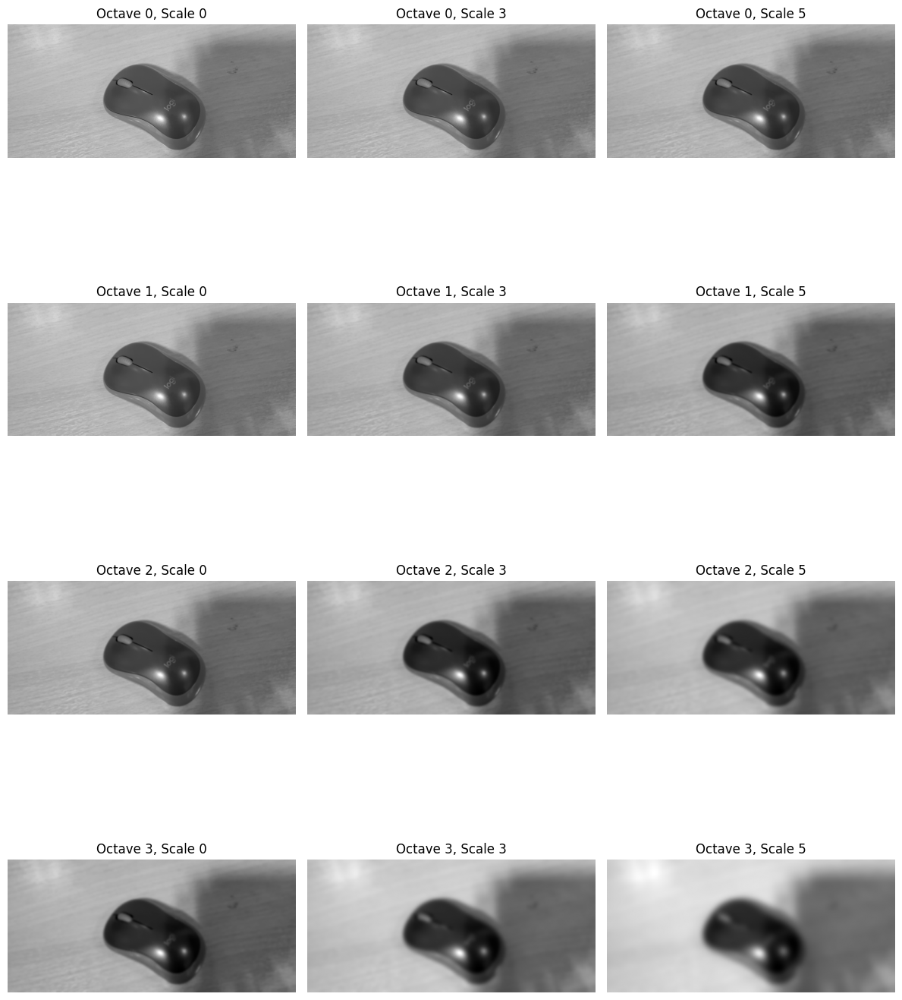

Visualizing Image 1 DoG Pyramid


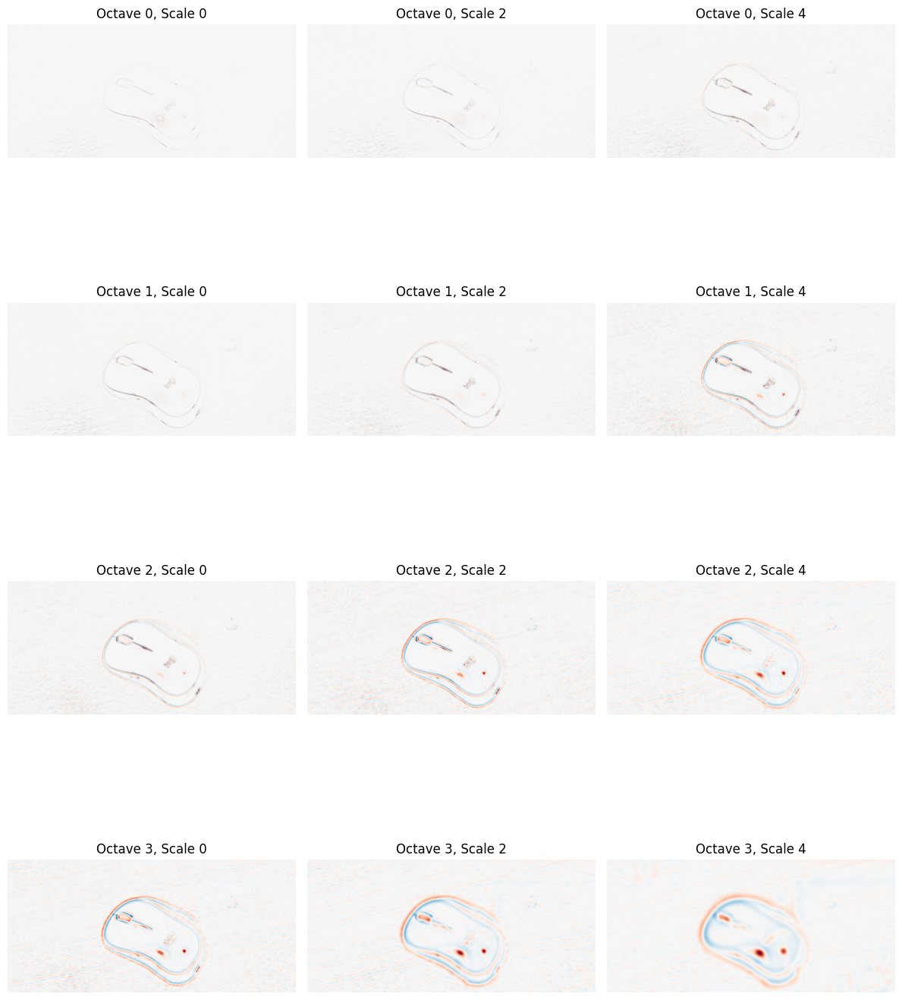

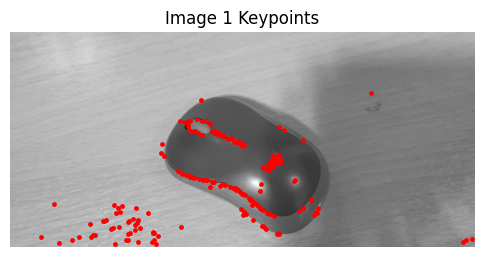

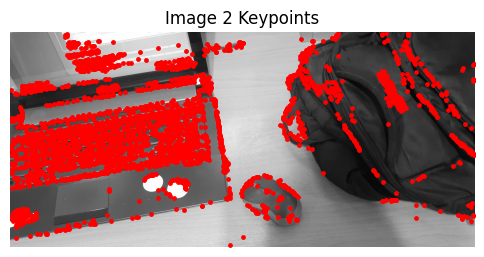

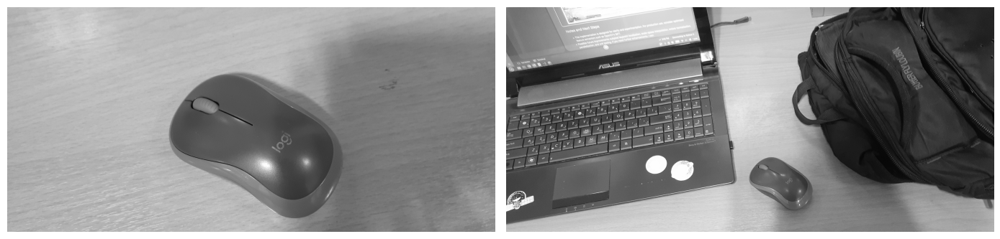

In [ ]:
# If you have image files in the working directory, set their names here and run this cell.
image1_path = '/content/mouse1.jpg'  # update if you have images
image2_path = '/content/Mouse2.jpg'  # update if you have images

import os
if os.path.exists(image1_path) and os.path.exists(image2_path):
    img1 = load_image_gray(image1_path)
    img2 = load_image_gray(image2_path)
    kp1, kp2, inliers, pyramid1, pyramid2, dog1, dog2, matches = sift_pipeline(img1, img2)
    print(f'Keypoints: {len(kp1)}, {len(kp2)}; Inliers after RANSAC: {len(inliers)}')

    visualize_gaussian_pyramid(pyramid1, 'Image 1 Gaussian Pyramid')
    visualize_dog_pyramid(dog1, 'Image 1 DoG Pyramid')
    visualize_keypoints(img1, kp1, 'Image 1 Keypoints')
    visualize_keypoints(img2, kp2, 'Image 2 Keypoints')
    visualize_matches(img1, img2, kp1, kp2, inliers)
else:
    print('Example images not present in the working directory; skip this cell or update paths.')

Building Gaussian pyramid
Building Gaussian pyramid
Computing DoG pyramid
Computing DoG pyramid
Detecting keypoints from DoG
Found 1615 keypoints
Detecting keypoints from DoG
Found 339 keypoints
Computing SIFT descriptors
Computing SIFT descriptors
Using custom SIFT implementation
Matching descriptors using ratio test
Found 12 good matches
Filtering matches with RANSAC
RANSAC inliers: 4 / 12
Keypoints: 1613, 337; Inliers after RANSAC: 4
Visualizing Image 1 Gaussian Pyramid


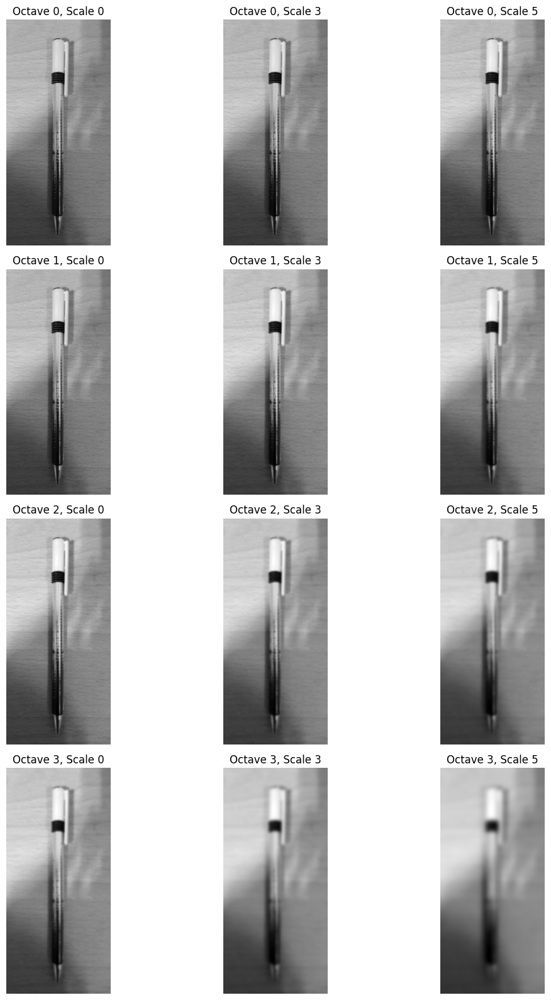

Visualizing Image 1 DoG Pyramid


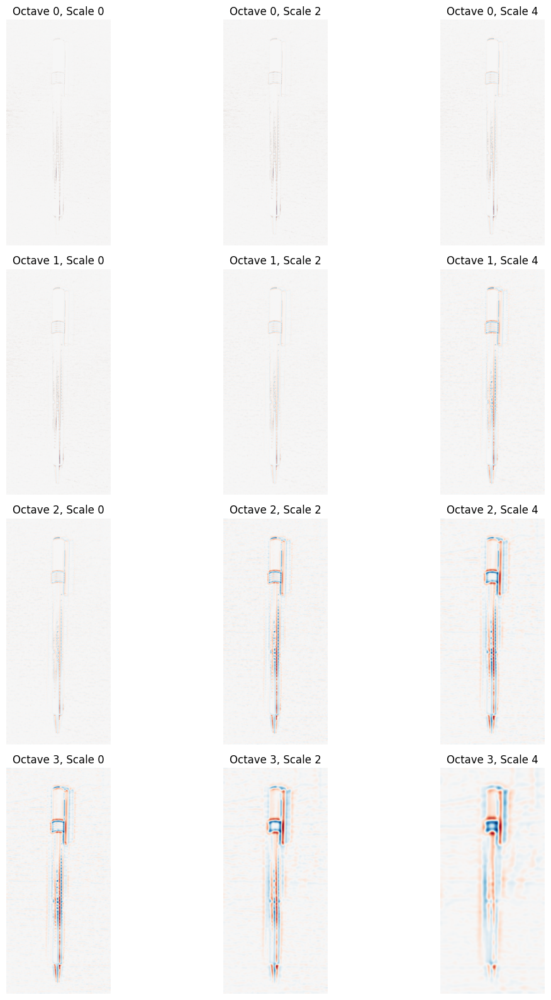

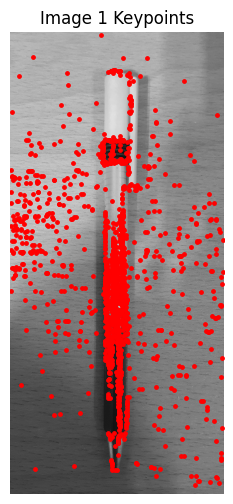

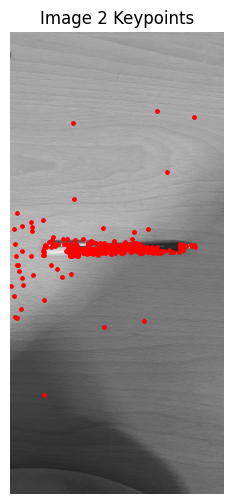

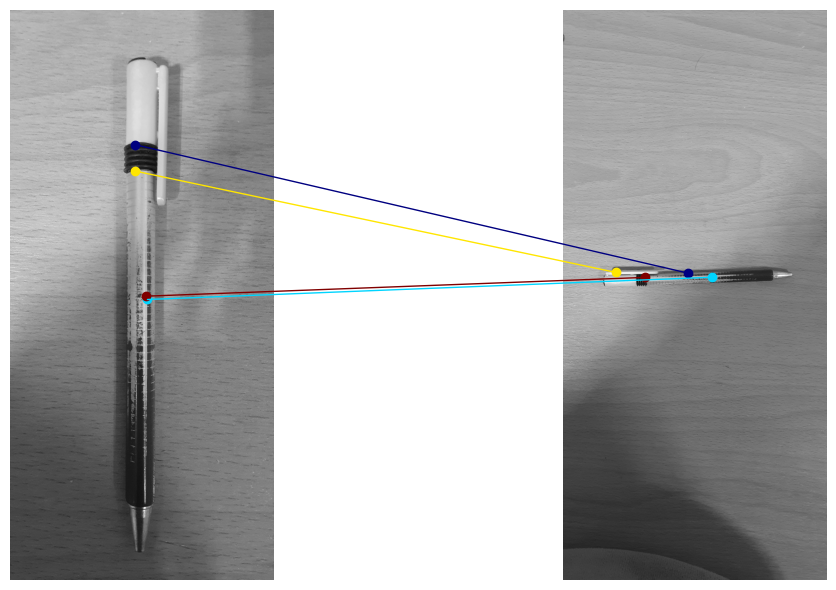

In [ ]:
# If you have image files in the working directory, set their names here and run this cell.
image1_path = '/content/pen1.jpg'  # update if you have images
image2_path = '/content/pen3.jpg'  # update if you have images

import os
if os.path.exists(image1_path) and os.path.exists(image2_path):
    img1 = load_image_gray(image1_path)
    img2 = load_image_gray(image2_path)
    kp1, kp2, inliers, pyramid1, pyramid2, dog1, dog2, matches = sift_pipeline(img1, img2)
    print(f'Keypoints: {len(kp1)}, {len(kp2)}; Inliers after RANSAC: {len(inliers)}')

    visualize_gaussian_pyramid(pyramid1, 'Image 1 Gaussian Pyramid')
    visualize_dog_pyramid(dog1, 'Image 1 DoG Pyramid')
    visualize_keypoints(img1, kp1, 'Image 1 Keypoints')
    visualize_keypoints(img2, kp2, 'Image 2 Keypoints')
    visualize_matches(img1, img2, kp1, kp2, inliers)
else:
    print('Example images not present in the working directory; skip this cell or update paths.')

Building Gaussian pyramid
Building Gaussian pyramid
Computing DoG pyramid
Computing DoG pyramid
Detecting keypoints from DoG
Found 1615 keypoints
Detecting keypoints from DoG
Found 2237 keypoints
Computing SIFT descriptors
Computing SIFT descriptors
Using custom SIFT implementation
Matching descriptors using ratio test
Found 2 good matches
Filtering matches with RANSAC
Keypoints: 1613, 2219; Inliers after RANSAC: 0
Visualizing Image 1 Gaussian Pyramid


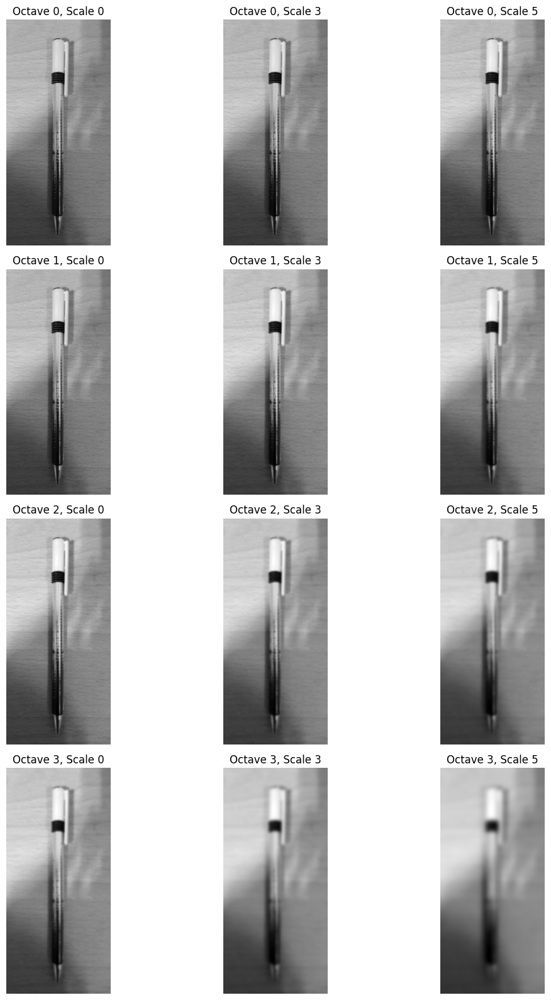

Visualizing Image 1 DoG Pyramid


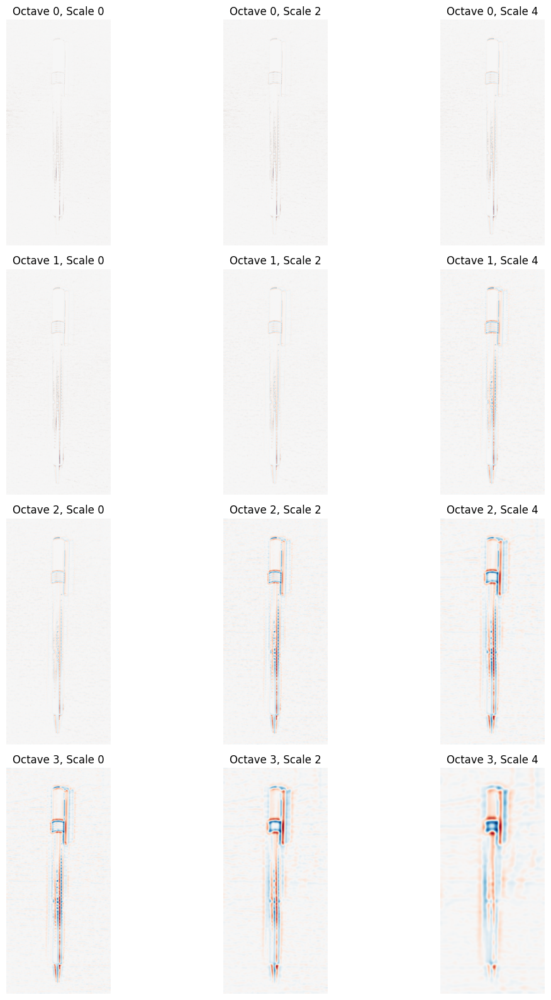

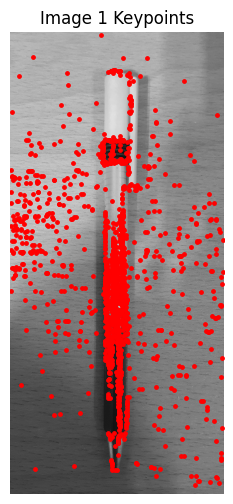

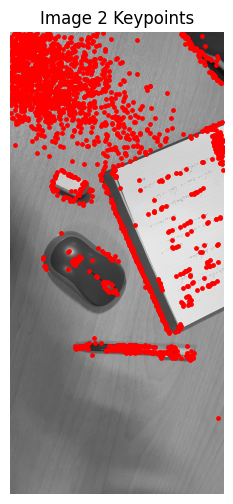

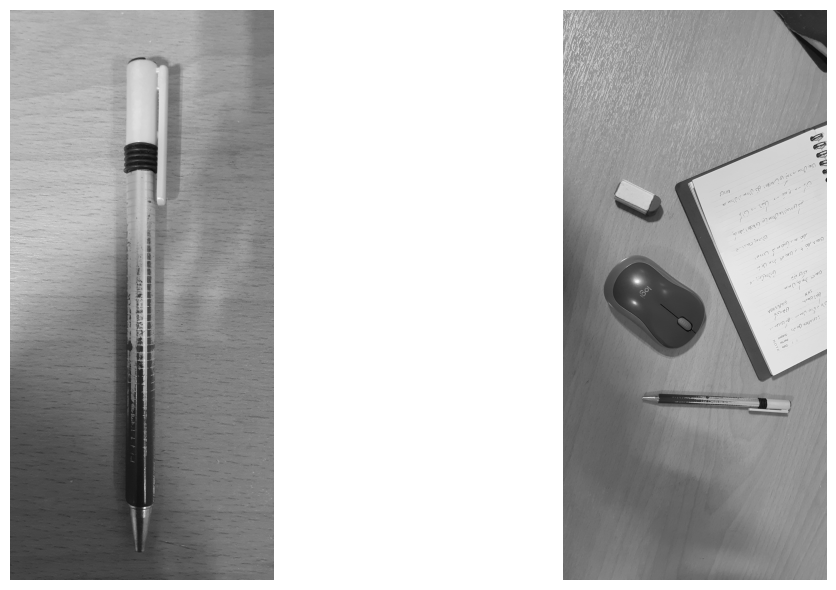

In [ ]:
# If you have image files in the working directory, set their names here and run this cell.
image1_path = '/content/pen1.jpg'  # update if you have images
image2_path = '/content/pen4.jpg'  # update if you have images

import os
if os.path.exists(image1_path) and os.path.exists(image2_path):
    img1 = load_image_gray(image1_path)
    img2 = load_image_gray(image2_path)
    kp1, kp2, inliers, pyramid1, pyramid2, dog1, dog2, matches = sift_pipeline(img1, img2)
    print(f'Keypoints: {len(kp1)}, {len(kp2)}; Inliers after RANSAC: {len(inliers)}')

    visualize_gaussian_pyramid(pyramid1, 'Image 1 Gaussian Pyramid')
    visualize_dog_pyramid(dog1, 'Image 1 DoG Pyramid')
    visualize_keypoints(img1, kp1, 'Image 1 Keypoints')
    visualize_keypoints(img2, kp2, 'Image 2 Keypoints')
    visualize_matches(img1, img2, kp1, kp2, inliers)
else:
    print('Example images not present in the working directory; skip this cell or update paths.')

Building Gaussian pyramid
Building Gaussian pyramid
Computing DoG pyramid
Computing DoG pyramid
Detecting keypoints from DoG
Found 636 keypoints
Detecting keypoints from DoG
Found 585 keypoints
Computing SIFT descriptors
Computing SIFT descriptors
Using custom SIFT implementation
Matching descriptors using ratio test
Found 15 good matches
Filtering matches with RANSAC
RANSAC inliers: 6 / 15
Keypoints: 636, 585; Inliers after RANSAC: 6
Visualizing Image 1 Gaussian Pyramid


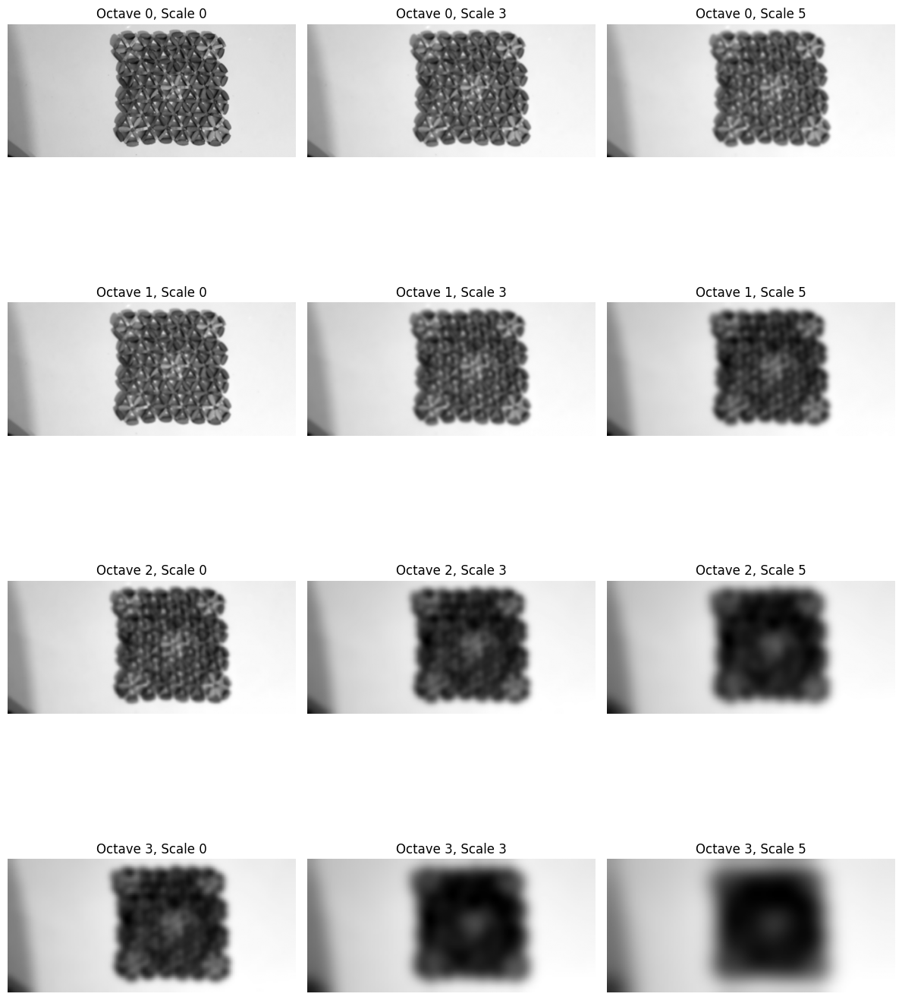

Visualizing Image 1 DoG Pyramid


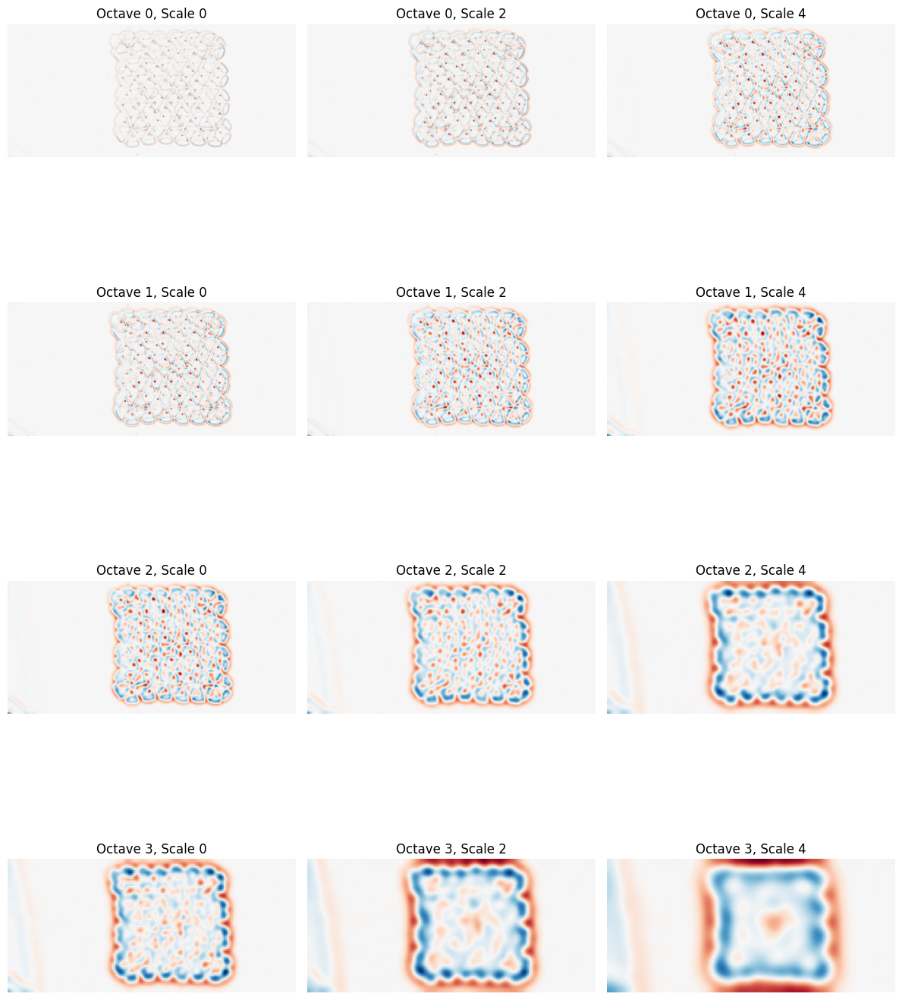

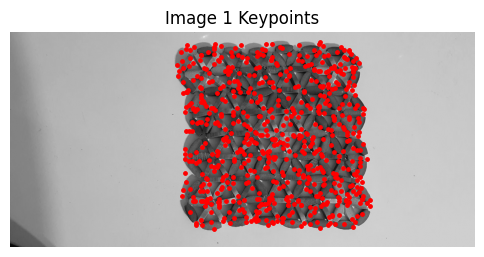

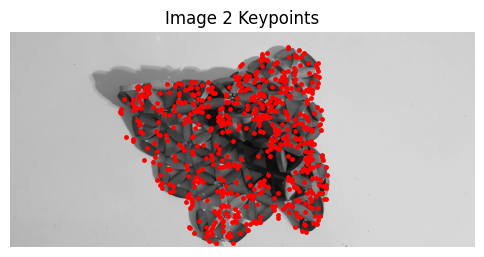

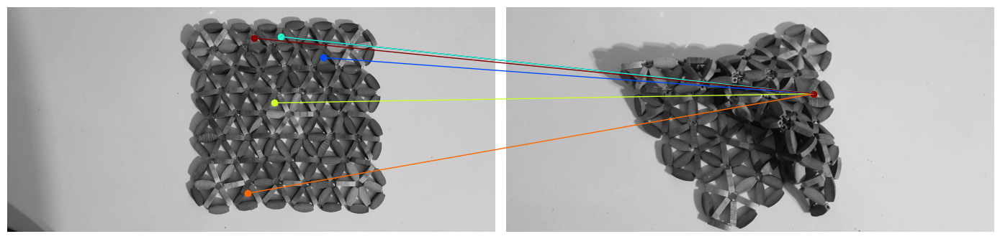

In [ ]:
# If you have image files in the working directory, set their names here and run this cell.
image1_path = '/content/s1.jpg'  # update if you have images
image2_path = '/content/s2.jpg'  # update if you have images

import os
if os.path.exists(image1_path) and os.path.exists(image2_path):
    img1 = load_image_gray(image1_path)
    img2 = load_image_gray(image2_path)
    kp1, kp2, inliers, pyramid1, pyramid2, dog1, dog2, matches = sift_pipeline(img1, img2)
    print(f'Keypoints: {len(kp1)}, {len(kp2)}; Inliers after RANSAC: {len(inliers)}')

    visualize_gaussian_pyramid(pyramid1, 'Image 1 Gaussian Pyramid')
    visualize_dog_pyramid(dog1, 'Image 1 DoG Pyramid')
    visualize_keypoints(img1, kp1, 'Image 1 Keypoints')
    visualize_keypoints(img2, kp2, 'Image 2 Keypoints')
    visualize_matches(img1, img2, kp1, kp2, inliers)
else:
    print('Example images not present in the working directory; skip this cell or update paths.')